# Importing Libraries for Image Processing, Machine Learning, and Model Building

- **NumPy & Pandas**: Data manipulation and analysis.
- **Matplotlib**: Visualization and image loading.
- **OpenCV (cv2)**: Advanced image processing.
- **Random & OS modules**: File handling and random sampling.
- **PIL (Pillow)**: Image loading and processing.
- **Scikit-learn**: Label encoding and data splitting utilities.
- **Keras**: Deep learning framework components including:
  - Image preprocessing utilities.
  - Model architecture layers (Conv2D, MaxPooling2D, Dense, etc.).
  - Optimizers and utilities for model training and serialization.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
import cv2
import random
import os
from os import listdir
from PIL import Image
from sklearn.preprocessing import label_binarize,  LabelBinarizer
from keras.preprocessing import image
from keras.preprocessing.image import img_to_array, array_to_img
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Flatten, Dropout, Dense
from sklearn.model_selection import train_test_split
from keras.models import model_from_json
from keras.utils import to_categorical 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    roc_auc_score,
    roc_curve,
    precision_recall_curve,
    average_precision_score,
    log_loss,
    balanced_accuracy_score,
    matthews_corrcoef
)

%matplotlib inline

2025-05-15 15:30:14.806866: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747323014.831150    1970 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747323014.838870    1970 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Setting Base Directory for Dataset

- Defines the path to the root folder containing the PlantVillage potato disease images.
- This path is used as the starting point to load and process images for training and evaluation.


In [2]:
base_dir="/kaggle/input/plantvillage-potato-disease-dataset/PlantVillage"

# Plotting Sample Images from Training Dataset

- Traverses the nested folder structure inside the directory to collect image file paths.
- Randomly selects 25 images from various classes for visualization.
- Displays the images in a 5x5 grid using Matplotlib.
- Shows the class name (folder name) as the title for each image, helping to identify categories.
- Useful for quick visual inspection of dataset diversity and quality.


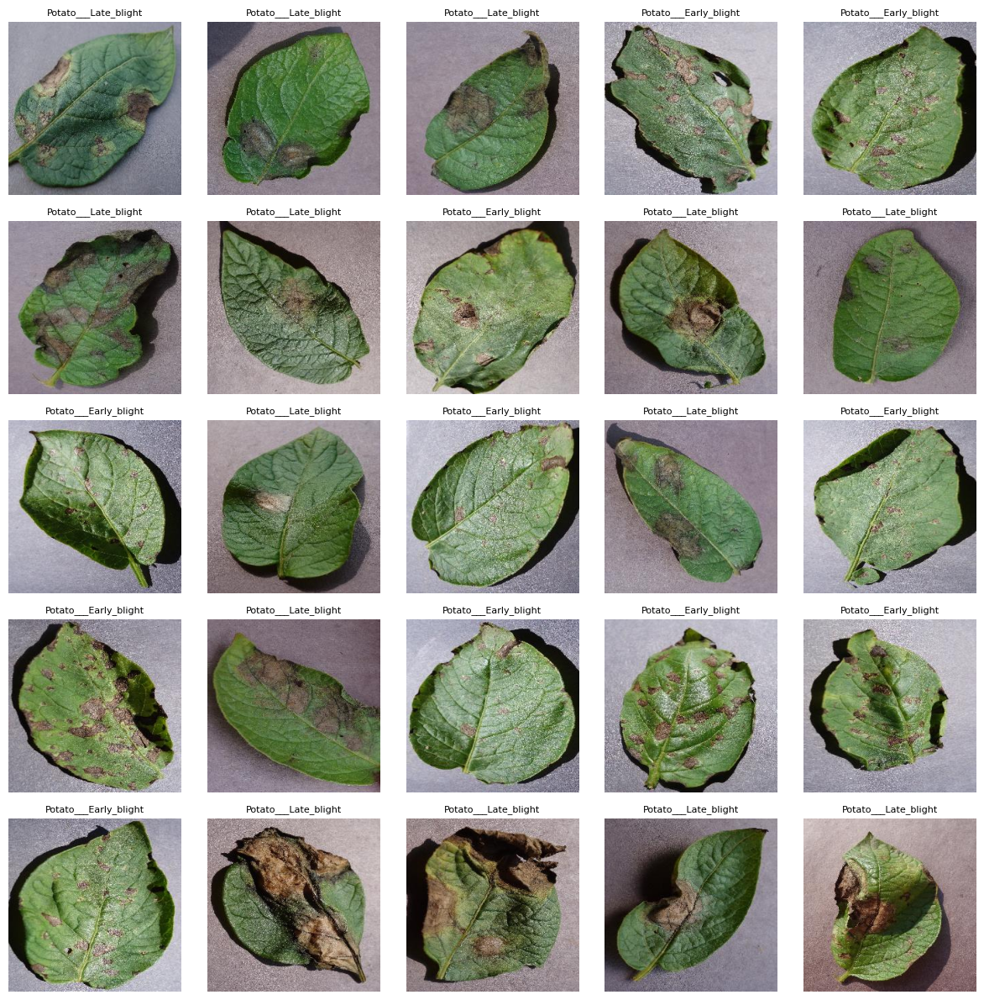

In [3]:
# Gather image file paths from all subfolders inside train
image_paths = []
for root, dirs, files in os.walk(base_dir):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(root, file))

# Randomly sample 25 images to display
sample_images = random.sample(image_paths, 25)

# Plotting 5x5 grid
fig, axes = plt.subplots(5, 5, figsize=(12, 12))
axes = axes.flatten()

for img_path, ax in zip(sample_images, axes):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(os.path.basename(os.path.dirname(img_path)), fontsize=8)  # folder name as title

plt.tight_layout()
plt.show()

# Visualizing Class Distribution in Training Dataset

- Iterates through each class directory to count the number of images.
- Stores the counts in a dictionary for easy access.
- Uses Seaborn to plot a bar chart showing image counts per class.
- Rotates x-axis labels for better readability.
- Helps identify class imbalance to inform data preprocessing decisions.
- Provides a clear visual overview of dataset composition.


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


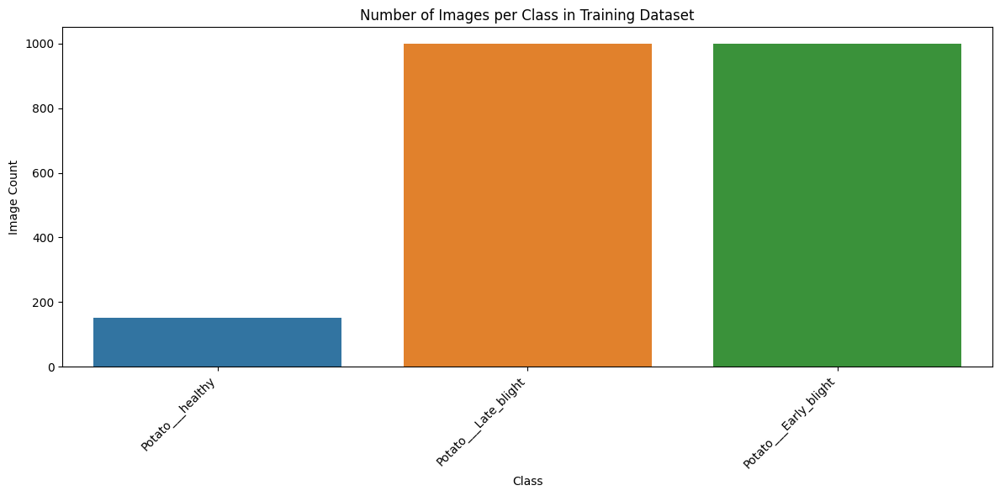

In [4]:
class_counts = {}

for class_name in os.listdir(base_dir):
    class_path = os.path.join(base_dir, class_name)
    if os.path.isdir(class_path):
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        class_counts[class_name] = len(image_files)

class_names = list(class_counts.keys())
image_counts = list(class_counts.values())

plt.figure(figsize=(12, 6))
sns.barplot(x=class_names, y=image_counts)
plt.xticks(rotation=45, ha='right')
plt.title('Number of Images per Class in Training Dataset')
plt.xlabel('Class')
plt.ylabel('Image Count')
plt.tight_layout()
plt.show()


# Visualizing Image Dimension Distributions

- Collects widths and heights of all images across all classes.
- Plots two side-by-side histograms to show how image widths and heights are distributed.
- Helps identify common image sizes and detect any significant size variation or outliers.
- Useful for deciding resizing strategies and preprocessing steps in model training.


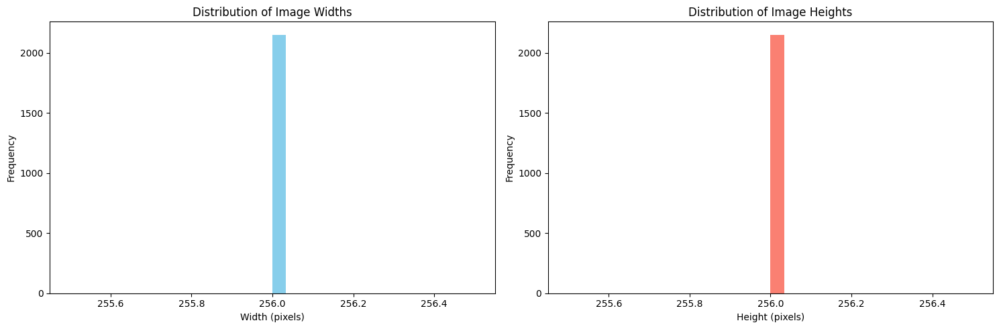

In [5]:
image_widths = []
image_heights = []

for class_name in os.listdir(base_dir):
    class_path = os.path.join(base_dir, class_name)
    if os.path.isdir(class_path):
        for img_name in os.listdir(class_path):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_path, img_name)
                img = Image.open(img_path)
                w, h = img.size
                image_widths.append(w)
                image_heights.append(h)

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.hist(image_widths, bins=30, color='skyblue')
plt.title('Distribution of Image Widths')
plt.xlabel('Width (pixels)')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(image_heights, bins=30, color='salmon')
plt.title('Distribution of Image Heights')
plt.xlabel('Height (pixels)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


# Correlation Heatmap of Image Dimensions

- Creates a DataFrame from collected image widths and heights.
- Computes the correlation matrix to measure relationships between width and height.
- Uses Seaborn’s heatmap to visualize the correlation with annotations.
- Applies the ‘magma’ color map for clear contrast.
- Helps understand how image dimensions relate, aiding in preprocessing decisions.


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


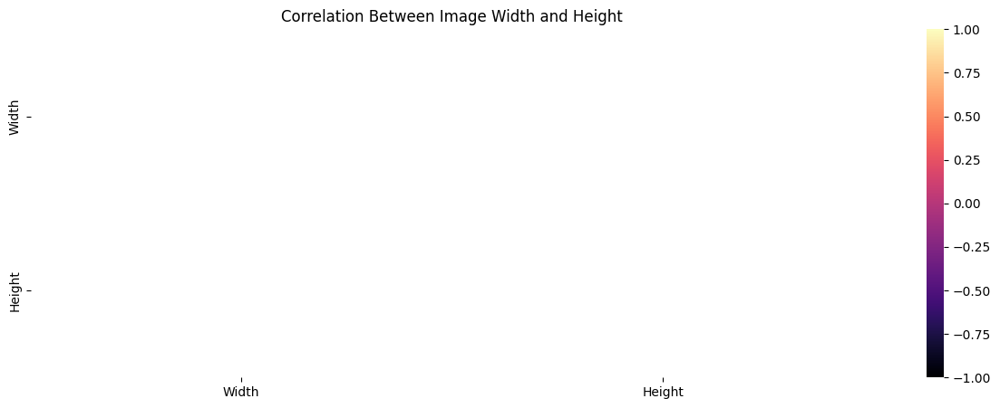

In [6]:
df_dims = pd.DataFrame({'Width': image_widths,'Height': image_heights})

# Calculate correlation matrix
corr = df_dims.corr()

# Plot heatmap
plt.figure(figsize=(15, 5))
sns.heatmap(corr, annot=True, cmap='magma', vmin=-1, vmax=1)
plt.title('Correlation Between Image Width and Height')
plt.show()


# Converting Images to Arrays for Model Input

- Defines a function to read an image from a given directory using OpenCV.
- Resizes the image to a fixed size (256x256) for consistent input dimensions.
- Converts the image to an array format compatible with Keras models.
- Handles cases where the image might be missing or unreadable by returning an empty array or `None`.
- Includes error handling to catch and report exceptions during processing.


In [7]:
def convert_image_to_array(image_dir):
    try:
        image = cv2.imread(image_dir)
        if image is not None:
            image = cv2.resize(image, (256, 256))
            # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            return img_to_array(image)
        else:
            return np.array([])
    except Exception as e:
        print(f"Error : {e}")
        return None

# Loading and Labeling Images from Dataset

- Lists all class directories inside the base dataset folder.
- Initializes empty lists to store image data and corresponding labels.
- Defines a mapping of class names to integer labels for model compatibility.
- Iterates over each class folder, reads all image files, and converts them to arrays using a helper function.
- Appends the image arrays and their respective class labels to separate lists.
- Ensures consistent labeling by using a temporary counter aligned with class order.


In [8]:
root_dir = listdir(base_dir)

image_list, label_list = [], []
all_labels = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']
binary_labels = [0, 1, 2]
temp = -1

# Reading and converting images to numpy arrays with correct directory usage
for directory in root_dir:
    plant_image_list = listdir(f"{base_dir}/{directory}")
    temp += 1
    for file in plant_image_list:
        image_path = f"{base_dir}/{directory}/{file}"
        image_list.append(convert_image_to_array(image_path))
        label_list.append(binary_labels[temp])

# Counting Image Samples per Class

- Creates a DataFrame from the list of labels.
- Uses `value_counts()` to count how many images belong to each class.
- Prints the counts to check for class distribution and imbalance in the dataset.


In [9]:
df = pd.DataFrame({'label': label_list})
counts = df['label'].value_counts()
print(counts)

label
1    1000
2    1000
0     152
Name: count, dtype: int64


In [10]:
image_list[0].shape

(256, 256, 3)

# Converting Labels to NumPy Array and Checking Shape

- Converts the list of labels into a NumPy array for efficient numerical operations.
- Checks the shape of the array to confirm the total number of labels collected.
- Ensures compatibility with machine learning frameworks that expect array inputs.


In [11]:
label_list = np.array(label_list)
label_list.shape

(2152,)

# Splitting Dataset into Training and Testing Sets

- Uses `train_test_split` from scikit-learn to split image data and labels.
- Allocates 80% of data for training and 20% for testing.
- Sets a random seed (`random_state=42`) for reproducible splits.
- Prepares the dataset for model training and evaluation.


# Splitting Dataset into Training and Testing Sets

- Uses scikit-learn’s `train_test_split` to divide images and labels.
- Reserves 20% of data for testing to evaluate model performance.
- Ensures reproducibility with `random_state=42`.
- Prepares data subsets for training and validation workflows.


In [12]:
x_train, x_test, y_train, y_test = train_test_split(image_list, label_list, test_size=0.2, random_state = 42) 

# Normalizing and Reshaping Image Data

- Converts training and testing image lists into NumPy arrays with `float16` datatype for memory efficiency.
- Normalizes pixel values by dividing by 225.0 (note: typically it’s 255.0) to scale pixels between 0 and 1.
- Reshapes arrays to 4D tensors compatible with Keras: `(samples, height, width, channels)`.
- Prepares data for input into convolutional neural networks.


In [13]:
x_train = np.array(x_train, dtype=np.float16) / 225.0
x_test = np.array(x_test, dtype=np.float16) / 225.0
x_train = x_train.reshape( -1, 256,256,3)
x_test = x_test.reshape( -1, 256,256,3)

# One-Hot Encoding Target Labels

- Converts integer class labels in training and testing sets into one-hot encoded vectors.
- Uses Keras’ `to_categorical` to format labels for multi-class classification models.
- Enables the model to output probabilities for each class instead of single integers.


In [14]:
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

# Defining a Convolutional Neural Network (CNN) Model

- Uses Keras `Sequential` API to build the model layer-by-layer.
- First convolutional layer with 32 filters, 3x3 kernel, ReLU activation, and same padding.
- Max pooling layer with 3x3 pool size to reduce spatial dimensions.
- Second convolutional layer with 16 filters, 3x3 kernel, and ReLU activation.
- Max pooling layer with 2x2 pool size for further downsampling.
- Flattens the feature maps into a 1D vector.
- Dense layer with 8 neurons and ReLU activation for learning complex features.
- Output layer with 3 neurons and softmax activation for multi-class classification.
- Prints a summary of the model architecture.


In [15]:
model = Sequential()
model.add(Conv2D(32, (3, 3), padding="same",input_shape=(256,256,3), activation="relu"))
model.add(MaxPooling2D(pool_size=(3, 3)))
model.add(Conv2D(16, (3, 3), padding="same", activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(8, activation="relu"))
model.add(Dense(3, activation="softmax"))
model.compile(loss = 'categorical_crossentropy', optimizer = Adam(0.0001),metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1747323036.000891    1970 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 256, 256, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 85, 85, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 85, 85, 16)          │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 42, 42, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 28224)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 8)                   │         225,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 3)                   │              27 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 231,347 (903.70 KB)

 Trainable params: 231,347 (903.70 KB)

 Non-trainable params: 0 (0.00 B)

# Training the CNN Model with Validation Split

- Splits the training data further into training and validation sets (80%-20%).
- Sets training parameters: 20 epochs and batch size of 64.
- Trains the model using `model.fit`, providing validation data to monitor performance during training.
- Stores the training history for later analysis of accuracy and loss trends.


In [16]:
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2)
epochs = 50
batch_size = 64
history = model.fit(x_train, y_train, batch_size = batch_size, epochs = epochs,validation_data = (x_val, y_val))

Epoch 1/50


I0000 00:00:1747323042.531877    2021 service.cc:148] XLA service 0x7f970800a7c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1747323042.531935    2021 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1747323042.702829    2021 cuda_dnn.cc:529] Loaded cuDNN version 90300


 5/22 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.2794 - loss: 1.1423

I0000 00:00:1747323045.447058    2021 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 267ms/step - accuracy: 0.3976 - loss: 1.0591 - val_accuracy: 0.4377 - val_loss: 0.9850
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.4538 - loss: 0.9598 - val_accuracy: 0.4406 - val_loss: 0.9222
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.4685 - loss: 0.8872 - val_accuracy: 0.4841 - val_loss: 0.8463
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.5106 - loss: 0.8245 - val_accuracy: 0.4928 - val_loss: 0.8098
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.5813 - loss: 0.7595 - val_accuracy: 0.6464 - val_loss: 0.7649
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.6279 - loss: 0.7366 - val_accuracy: 0.5971 - val_loss: 0.7451
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.6676 - loss: 0.7009 - val_accuracy: 0.6957 - val_loss: 0.7226
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.7126 - loss: 0.6848 - val_accuracy: 0.7739 - val_loss: 

In [17]:
model.save('my_model.keras')


# Training and Validation Accuracy and Loss Curves

- Plots model accuracy over epochs for both training and validation datasets.
- Visualizes training and validation loss across epochs.
- Helps monitor learning progress and detect overfitting or underfitting.
- Uses side-by-side subplots for clear comparison between accuracy and loss metrics.
- Includes legends and axis labels for better readability.


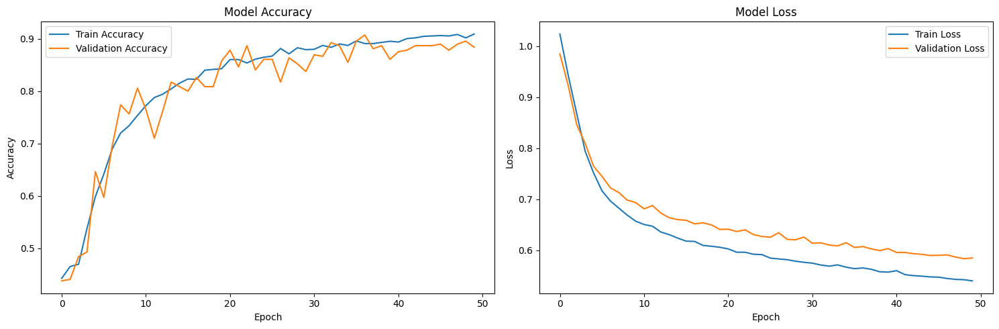

In [18]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


# Confusion Matrix Plot for Model Evaluation

- Predicts class probabilities on the test set using the trained model.
- Converts predicted probabilities and true labels from one-hot encoding to class indices.
- Computes the confusion matrix to compare predicted and actual labels.
- Visualizes the confusion matrix using Seaborn heatmap with class labels on axes.
- Helps identify model accuracy and common misclassifications between classes.


14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


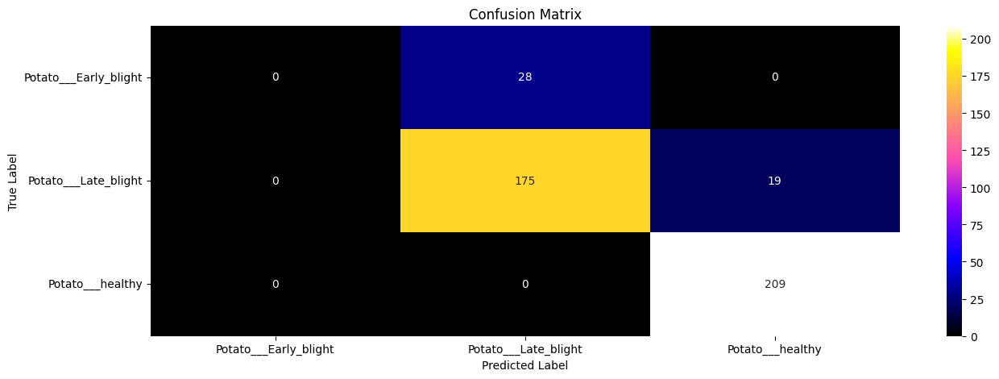

In [19]:
# Predict classes for test data
y_pred_probs = model.predict(x_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using seaborn heatmap
plt.figure(figsize=(15, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='gnuplot2', xticklabels=all_labels, yticklabels=all_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Displaying the Classification Report

- Prints precision, recall, F1-score, and support metrics for each class.
- Summarizes model performance in detail across all classes.
- Helps evaluate model strengths and weaknesses.
- Useful for understanding class-wise prediction quality beyond accuracy.


In [20]:
report = classification_report(y_true, y_pred, target_names=all_labels)
print(report)

                       precision    recall  f1-score   support

Potato___Early_blight       0.00      0.00      0.00        28
 Potato___Late_blight       0.86      0.90      0.88       194
     Potato___healthy       0.92      1.00      0.96       209

             accuracy                           0.89       431
            macro avg       0.59      0.63      0.61       431
         weighted avg       0.83      0.89      0.86       431



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# ROC Curves for Each Class

- Binarizes multiclass labels for one-vs-rest ROC calculation.
- Plots ROC curves to show the trade-off between true positive and false positive rates.
- Displays Area Under the Curve (AUC) scores in the legend for model quality per class.
- Includes a diagonal baseline representing random classifier performance.
- Useful for evaluating model discrimination ability in multi-class classification.


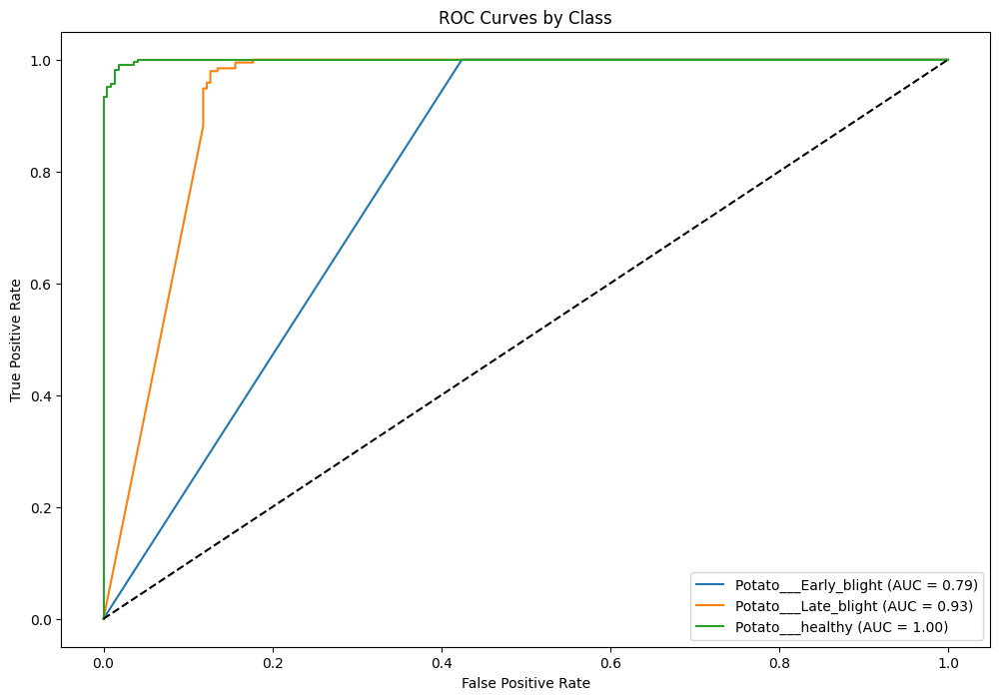

In [21]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np

# Binarize the true labels for multiclass ROC
y_true_bin = label_binarize(y_true, classes=range(len(all_labels)))

plt.figure(figsize=(12, 8))

for i in range(len(all_labels)):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{all_labels[i]} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random guess
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves by Class')
plt.legend(loc='lower right')
plt.show()


# Precision-Recall Curves for Each Class

- Binarizes multiclass true labels for one-vs-rest precision-recall computation.
- Plots curves illustrating trade-offs between precision and recall across thresholds.
- Shows Average Precision (AP) scores in the legend as a summary metric.
- Helpful for evaluating model performance, especially on imbalanced classes.


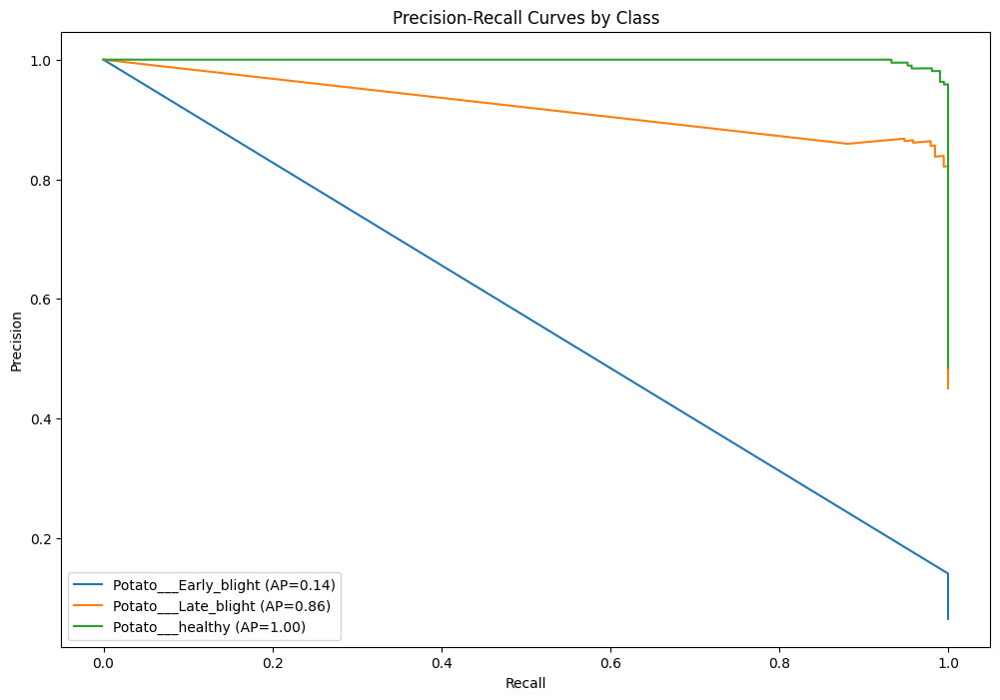

In [22]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Binarize true labels
y_true_bin = label_binarize(y_true, classes=range(len(all_labels)))

plt.figure(figsize=(12, 8))

for i in range(len(all_labels)):
    precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_probs[:, i])
    ap = average_precision_score(y_true_bin[:, i], y_pred_probs[:, i])
    plt.plot(recall, precision, label=f'{all_labels[i]} (AP={ap:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves by Class')
plt.legend(loc='lower left')
plt.show()


# Visualizing Misclassified Images with Highlighted Titles

- Displays misclassified images with true and predicted labels shown in red for emphasis.
- Converts image arrays to `uint8` for proper visualization.
- Helps quickly spot errors and assess model weaknesses visually.


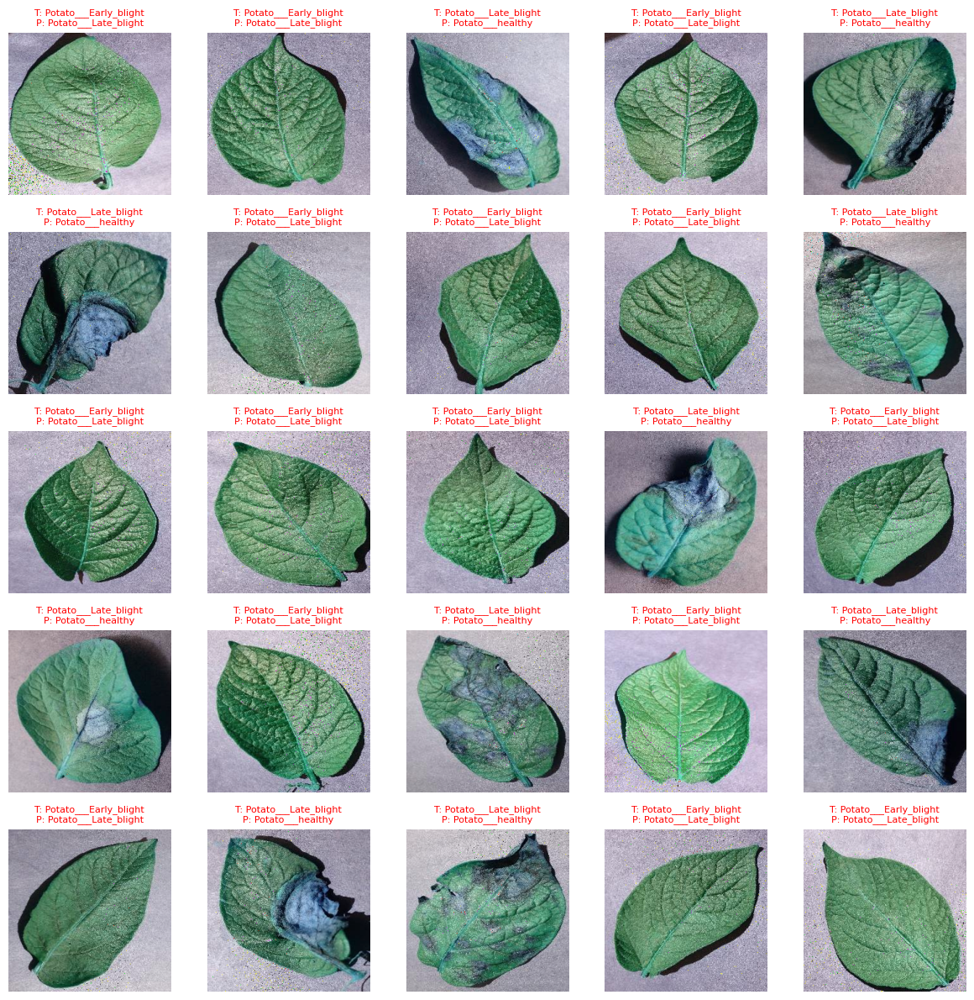

In [23]:
# Get predicted and true labels
y_pred_labels = np.argmax(y_pred_probs, axis=1)
y_true_labels = np.argmax(y_test, axis=1)

# Find misclassified indices
misclassified_indices = np.where(y_pred_labels != y_true_labels)[0]

# Limit to 25 images
num_images = min(25, len(misclassified_indices))
selected_indices = misclassified_indices[:num_images]

plt.figure(figsize=(12, 12))

for i, idx in enumerate(selected_indices):
    plt.subplot(5, 5, i + 1)
    
    # Convert float image to uint8 before displaying
    img = x_test[idx]
    if img.dtype != np.uint8:
        img = (img * 255).astype(np.uint8)
    
    plt.imshow(img)
    plt.title(f"T: {all_labels[y_true_labels[idx]]}\nP: {all_labels[y_pred_labels[idx]]}", fontsize=8, color='red')
    plt.axis('off')

plt.tight_layout()
plt.show()


# Visualizing Predictions with Confidence and Color-Coded Titles

- Shows 25 test images in a 5x5 grid.
- Titles display predicted label (P), true label (T), and confidence score.
- Title color is green if prediction matches true label, otherwise red.
- Converts images to `uint8` format for accurate display.
- Helps quickly identify correct and incorrect predictions with confidence levels.


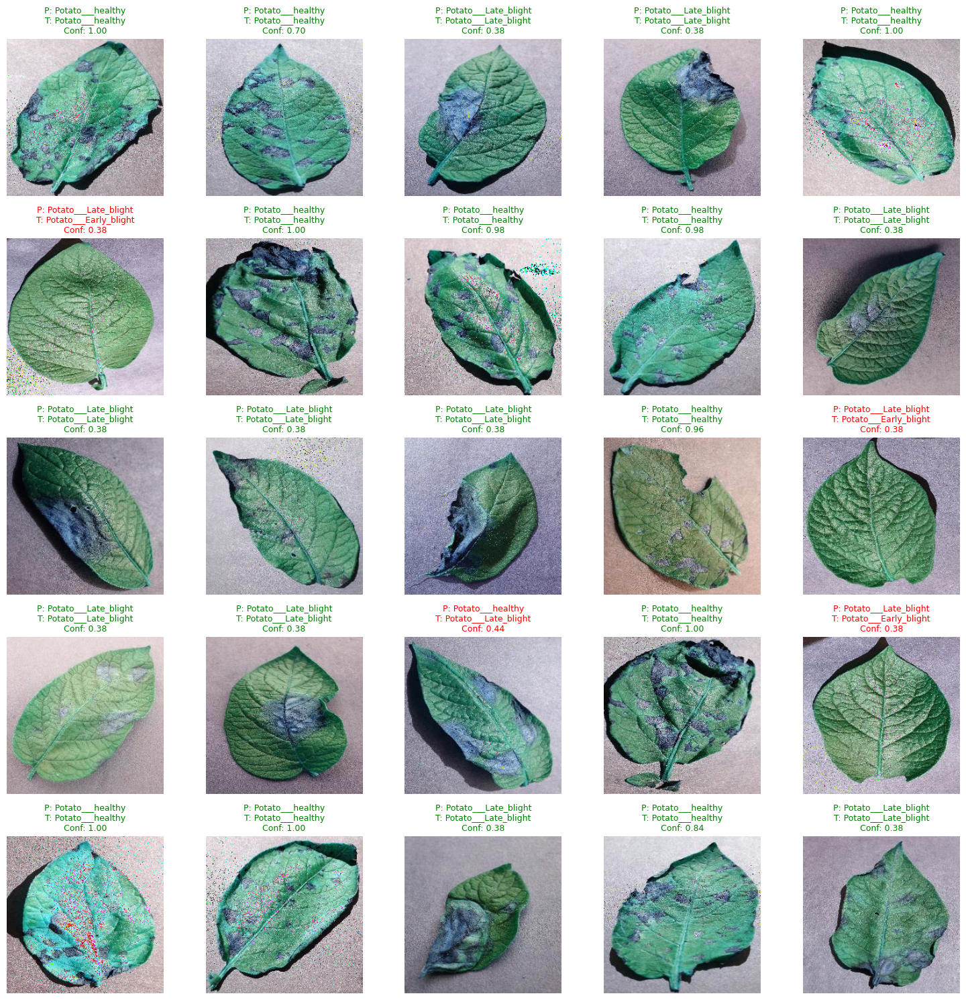

In [24]:
# Predicted classes, true classes, and confidence scores
y_pred_labels = np.argmax(y_pred_probs, axis=1)
y_true_labels = np.argmax(y_test, axis=1)
confidences = np.max(y_pred_probs, axis=1)

# Select number of images to show
num_images = 25

plt.figure(figsize=(15, 15))

for i in range(num_images):
    plt.subplot(5, 5, i + 1)
    img = x_test[i]
    
    # Convert to uint8 if needed
    if img.dtype != np.uint8:
        img = (img * 255).astype(np.uint8)
    
    plt.imshow(img)
    
    pred_label = all_labels[y_pred_labels[i]]
    true_label = all_labels[y_true_labels[i]]
    confidence = confidences[i]
    
    # Title color green if correct, red if incorrect
    color = 'green' if y_pred_labels[i] == y_true_labels[i] else 'red'
    plt.title(f"P: {pred_label}\nT: {true_label}\nConf: {confidence:.2f}", color=color, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()


# Custom Data Prediction

In [25]:
! wget "https://image.shutterstock.com/image-photo/early-blight-disease-on-potato-260nw-1655696635.jpg"

--2025-05-15 15:31:56--  https://image.shutterstock.com/image-photo/early-blight-disease-on-potato-260nw-1655696635.jpg
Resolving image.shutterstock.com (image.shutterstock.com)... 3.161.188.54, 3.161.188.109, 3.161.188.75, ...
Connecting to image.shutterstock.com (image.shutterstock.com)|3.161.188.54|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 54417 (53K) [image/jpeg]
Saving to: ‘early-blight-disease-on-potato-260nw-1655696635.jpg.3’

early-blight-diseas 100%[===================>]  53.14K  --.-KB/s    in 0.01s   

2025-05-15 15:31:56 (4.44 MB/s) - ‘early-blight-disease-on-potato-260nw-1655696635.jpg.3’ saved [54417/54417]



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


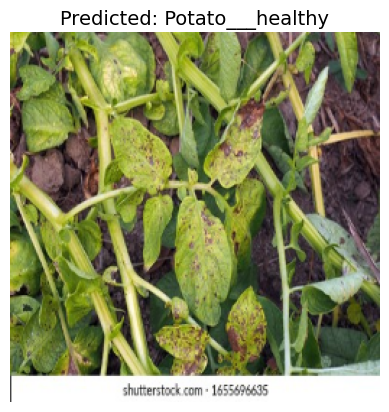

In [26]:
image=cv2.imread("/kaggle/working/early-blight-disease-on-potato-260nw-1655696635.jpg")
image_resize=cv2.resize(image,(256,256))
image_rgb = cv2.cvtColor(image_resize, cv2.COLOR_BGR2RGB)
image_norm = image_rgb.astype(np.float32) / 255.0
input_img = np.expand_dims(image_norm, axis=0)
pred=model.predict(input_img)
final = all_labels[np.argmax(pred, axis=1)[0]]
plt.imshow(image_rgb)
plt.title(f"Predicted: {final}", fontsize=14)
plt.axis('off')
plt.show()

# Checking Library Versions

- Prints the installed versions of key libraries used in the project.
- Helps ensure compatibility and troubleshoot version-related issues.
- Useful for documentation and reproducibility of your environment.


In [27]:
import numpy as np
import pandas as pd
import matplotlib
import cv2
import PIL
import sklearn
import keras
import seaborn as sns

print("NumPy version:", np.__version__)
print("Pandas version:", pd.__version__)
print("Matplotlib version:", matplotlib.__version__)
print("OpenCV version:", cv2.__version__)
print("Pillow (PIL) version:", PIL.__version__)
print("Scikit-learn version:", sklearn.__version__)
print("Keras version:", keras.__version__)
print("Seaborn version:", sns.__version__)


NumPy version: 1.26.4
Pandas version: 2.2.3
Matplotlib version: 3.7.2
OpenCV version: 4.11.0
Pillow (PIL) version: 11.1.0
Scikit-learn version: 1.2.2
Keras version: 3.8.0
Seaborn version: 0.12.2
